# Lab 5

by Bjørn Christian Weinbach

## Problem 1 a)
### Imports

In [1]:
# from sklearn.neighbors.kde import KernelDensity
from sklearn.neighbors import KernelDensity
from sklearn.metrics import accuracy_score
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.metrics import confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_validate
from sklearn.model_selection import GridSearchCV
import pickle
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
sys.path.append("..") # Adds higher directory to python modules path.
import pdffuns

### Read Data

In [2]:
pfile = '../LinearDiscriminantFunctions/lab4.p'
with open(pfile, "rb") as fp:
    Test, Train = pickle.load(fp)

### Helper Functions

In [3]:
def readData(Dataset):
    classes, features = len(Dataset), len(Dataset[0])
    classwiseData = {}
    data = pd.DataFrame()

    for cl in range(classes):
        classwiseData[cl] = [Dataset[cl][i] for i in range(features)]

    for label, features in classwiseData.items():
        df = pd.DataFrame()
        for i, feature in enumerate(features):
            index = 'x{}'.format(i+1)
            df[index] = feature

        df['class'] = label
        data = data.append(df, ignore_index=True)

    return data

def multiclassPlot(data, decision=None):
    plt.rcParams['figure.dpi'] = 150
    for i in data['class'].unique():
        plt.scatter(data[data['class'] == i]['x1'], data[data['class'] == i]['x2'], 
                    label='$\omega_{}$'.format(i+1))
    plt.legend()

    if decision is not None:
        x1_scale = np.arange(data['x1'].min(), data['x1'].max(), 0.1)
        x2_scale = np.arange(data['x2'].min(), data['x2'].max(), 0.1)
        plt.contourf(x1_scale, x2_scale, decision, alpha=0.4, cmap='bwr')


def list2mat(Dataset):
    data = readData(Dataset)
    return data.loc[:, data.columns != 'class'].values, data['class'].values

In [4]:
### Convert data to dataframes 

In [5]:
train, test, = readData(Train), readData(Test)

In [6]:
train

,x1,x2,class
0,2.573774,1.595112,0
1,3.840714,6.377155,0
2,4.601967,6.254209,0
3,2.809027,3.711119,0
4,2.915719,2.997328,0
...,...,...,...
195,1.493373,-3.841318,1
196,3.343888,-0.788625,1
197,6.687969,-1.075267,1
198,2.979211,-1.730765,1


### Visualise the data

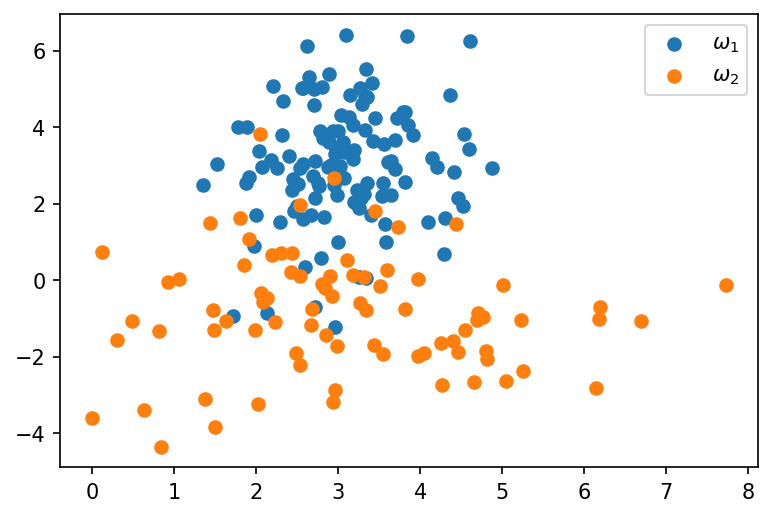

In [7]:
multiclassPlot(train)

### Classifier using Kernel Density Estimator with $h=0.1$

In [8]:
kde1 = KernelDensity(
    kernel='gaussian',
    bandwidth=0.1
)

kde2 = KernelDensity(
    kernel='gaussian',
    bandwidth=0.1
)

# Train on training data
kde1.fit(train[train['class'] == 0].values[:, :2])
kde2.fit(train[train['class'] == 1].values[:, :2])

KernelDensity(bandwidth=0.1)

#### Classify data.

In [9]:
# Test
pred_test = (kde1.score_samples(test.values[:, :2]) < kde2.score_samples(test.values[:, :2])).astype(int)
# Reclassification
pred_train = (kde1.score_samples(train.values[:, :2]) < kde2.score_samples(train.values[:, :2])).astype(int)

#### Calculate error rate

In [10]:
train_error = 1 - accuracy_score(train['class'], pred_train)
print("Error rate on train set: " + str(train_error))
test_error = 1 - accuracy_score(test['class'], pred_test)
print("Error rate on test set: " + str(test_error))

Error rate on train set: 0.025000000000000022
Error rate on test set: 0.10499999999999998


As observed before with small windows/bandwith, the model overfits and fails to generalise which is seen in the increased error in the test set compared to the training set. Though the performance here is better than parzen in lab 4.

### Decision Region - Train

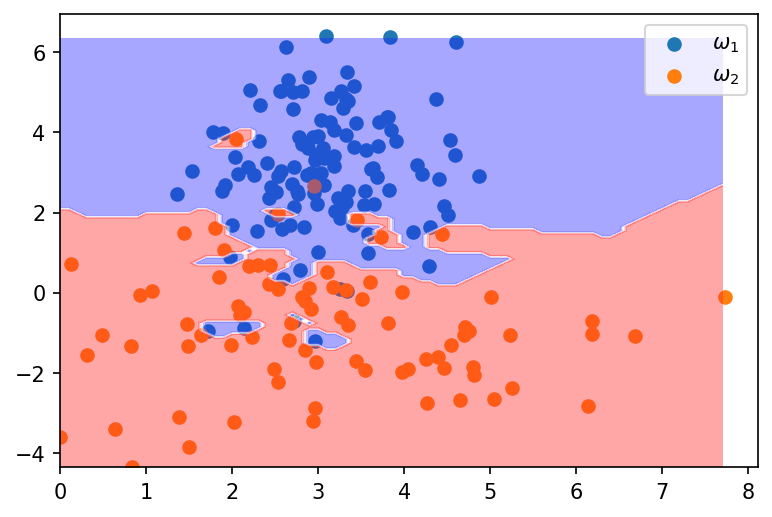

In [11]:
x1_scale = np.arange(train['x1'].min(), train['x1'].max(), 0.1)
x2_scale = np.arange(train['x2'].min(), train['x2'].max(), 0.1)
x_grid, y_grid = np.meshgrid(x1_scale, x2_scale)
shape = np.shape(x_grid)
compoints = np.array([x_grid.flatten(), y_grid.flatten()])
decbound = (kde1.score_samples(compoints.T) < kde2.score_samples(compoints.T)).reshape(shape).astype(int)

multiclassPlot(train, decbound)

### Decision Region - Test

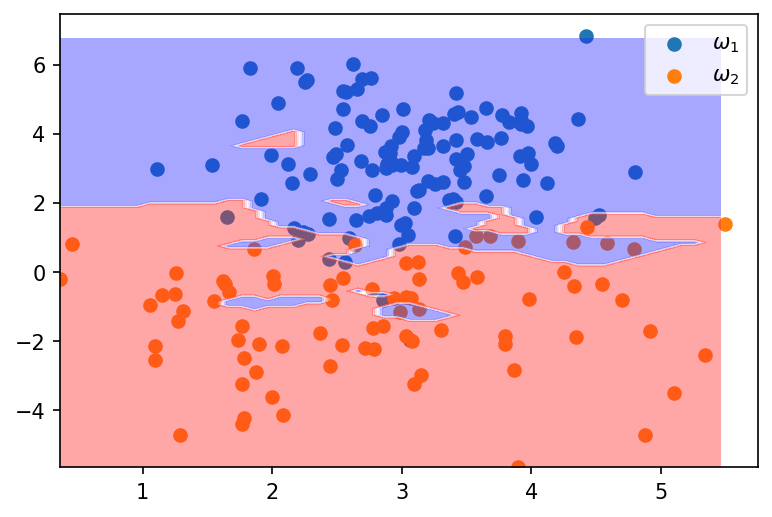

In [12]:
x1_scale = np.arange(test['x1'].min(), test['x1'].max(), 0.1)
x2_scale = np.arange(test['x2'].min(), test['x2'].max(), 0.1)
x_grid, y_grid = np.meshgrid(x1_scale, x2_scale)
shape = np.shape(x_grid)
compoints = np.array([x_grid.flatten(), y_grid.flatten()])
decbound = (kde1.score_samples(compoints.T) < kde2.score_samples(compoints.T)).reshape(shape).astype(int)

multiclassPlot(test, decbound)

### Classifier using Kernel Density Estimator with $h=5$

In [13]:
kde1 = KernelDensity(
    kernel='gaussian',
    bandwidth=5
)

kde2 = KernelDensity(
    kernel='gaussian',
    bandwidth=5
)

# Train on training data
kde1.fit(train[train['class'] == 0].values[:, :2])
kde2.fit(train[train['class'] == 1].values[:, :2])

KernelDensity(bandwidth=5)

### Classify data

In [14]:
# Test
pred_test = (kde1.score_samples(test.values[:, :2]) < kde2.score_samples(test.values[:, :2])).astype(int)
# Reclassification
pred_train = (kde1.score_samples(train.values[:, :2]) < kde2.score_samples(train.values[:, :2])).astype(int)

In [15]:
train_error = 1 - accuracy_score(train['class'], pred_train)
print("Error rate on train set: " + str(train_error))
test_error = 1 - accuracy_score(test['class'], pred_test)
print("Error rate on test set: " + str(test_error))

Error rate on train set: 0.08999999999999997
Error rate on test set: 0.050000000000000044


This time the training error and test error is much closer to what we got in lab 4. The model also does not overfit.

In [16]:
### Decision Region - Train

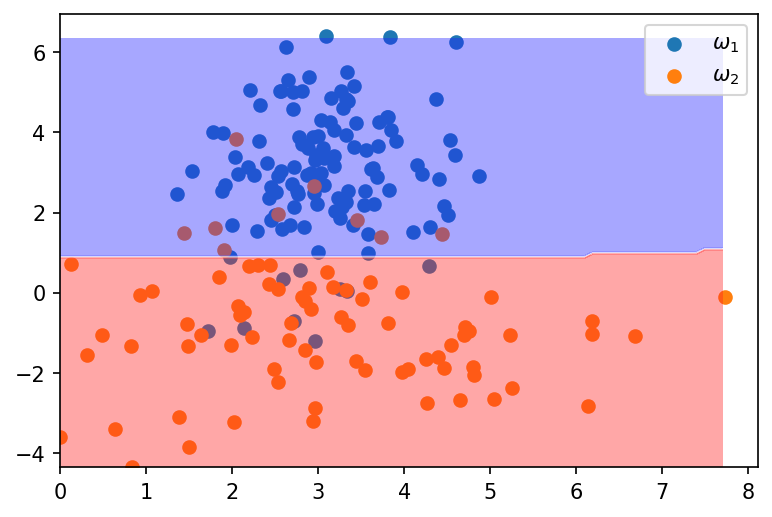

In [17]:
x1_scale = np.arange(train['x1'].min(), train['x1'].max(), 0.1)
x2_scale = np.arange(train['x2'].min(), train['x2'].max(), 0.1)
x_grid, y_grid = np.meshgrid(x1_scale, x2_scale)
shape = np.shape(x_grid)
compoints = np.array([x_grid.flatten(), y_grid.flatten()])
decbound = (kde1.score_samples(compoints.T) < kde2.score_samples(compoints.T)).reshape(shape).astype(int)

multiclassPlot(train, decbound)

In [18]:
### Decision region - test

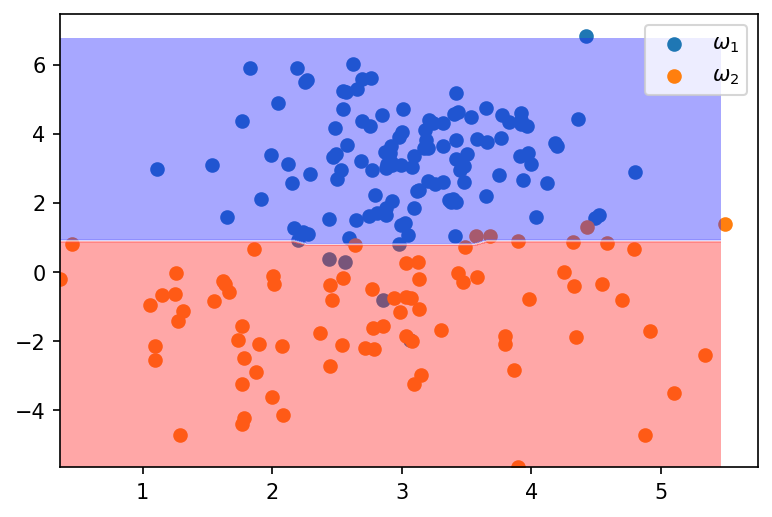

In [19]:
x1_scale = np.arange(test['x1'].min(), test['x1'].max(), 0.1)
x2_scale = np.arange(test['x2'].min(), test['x2'].max(), 0.1)
x_grid, y_grid = np.meshgrid(x1_scale, x2_scale)
shape = np.shape(x_grid)
compoints = np.array([x_grid.flatten(), y_grid.flatten()])
decbound = (kde1.score_samples(compoints.T) < kde2.score_samples(compoints.T)).reshape(shape).astype(int)

multiclassPlot(test, decbound)

## Problem 1 b)

In [20]:
X, yx = list2mat(Test)
Y, yy = list2mat(Train)

## Problem 1 c)

### Reclassify training data

In [21]:
clf = QuadraticDiscriminantAnalysis()
clf.fit(Y, yy)
pred_train = clf.predict(Y)
pred_test = clf.predict(X)

In [22]:
confusion_matrix(yy, pred_train)

array([[112,   8],
       [ 12,  68]], dtype=int64)

In [23]:
1 - accuracy_score(yy, pred_train)

0.09999999999999998

### Classify test data

In [24]:
confusion_matrix(yx, pred_test)

array([[116,   4],
       [  5,  75]], dtype=int64)

In [25]:
1 - accuracy_score(yx, pred_test)

0.04500000000000004

### Decision region - test

..\pdffuns.py:365: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xx, yy, Z, cmap='RdBu',


<AxesSubplot:>

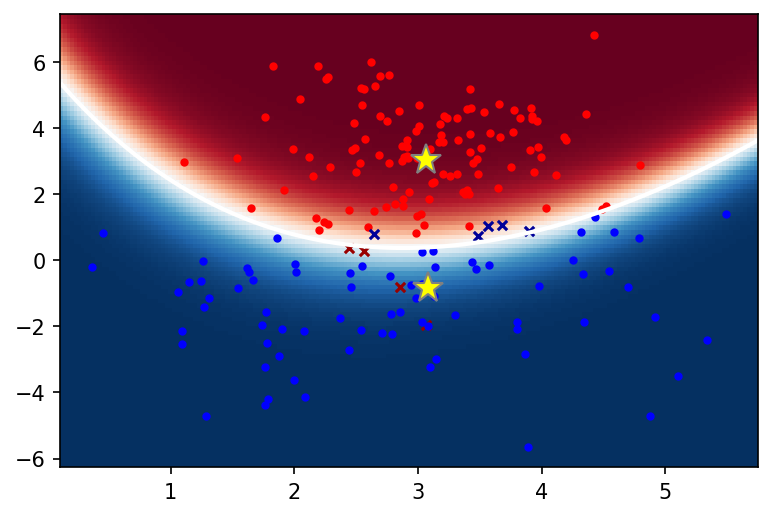

In [26]:
pdffuns.plot_data(clf, X, yx, pred_test)

### Decision region - train

..\pdffuns.py:365: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xx, yy, Z, cmap='RdBu',


<AxesSubplot:>

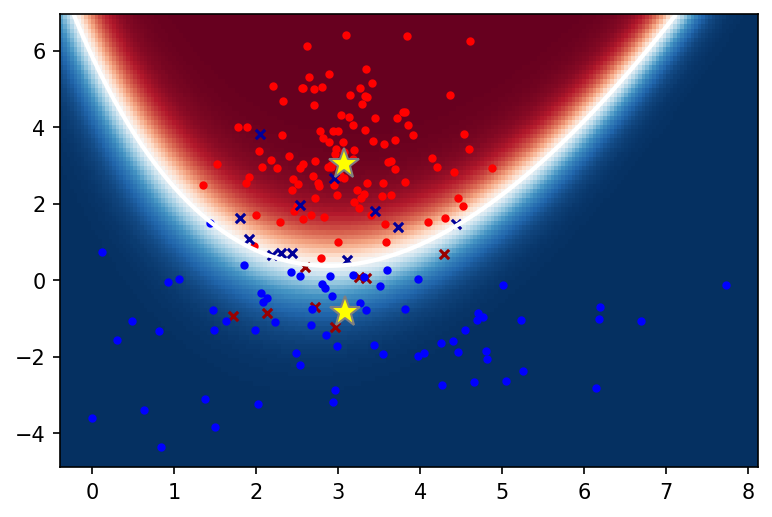

In [27]:
pdffuns.plot_data(clf, Y, yy, pred_train)

## Problem 1 d)

### Reclassify training data

In [28]:
clf = KNeighborsClassifier(n_neighbors=5)
clf.fit(Y, yy)
pred_train = clf.predict(Y)
pred_test = clf.predict(X)

In [29]:
confusion_matrix(yy, pred_train)

array([[110,  10],
       [  6,  74]], dtype=int64)

In [30]:
1 - accuracy_score(yy, pred_train)

0.07999999999999996

### Classify test data

In [31]:
confusion_matrix(yx, pred_test)

array([[111,   9],
       [  8,  72]], dtype=int64)

In [32]:
1 - accuracy_score(yx, pred_test)

0.08499999999999996

### Decision region - test

..\pdffuns.py:365: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xx, yy, Z, cmap='RdBu',


<AxesSubplot:>

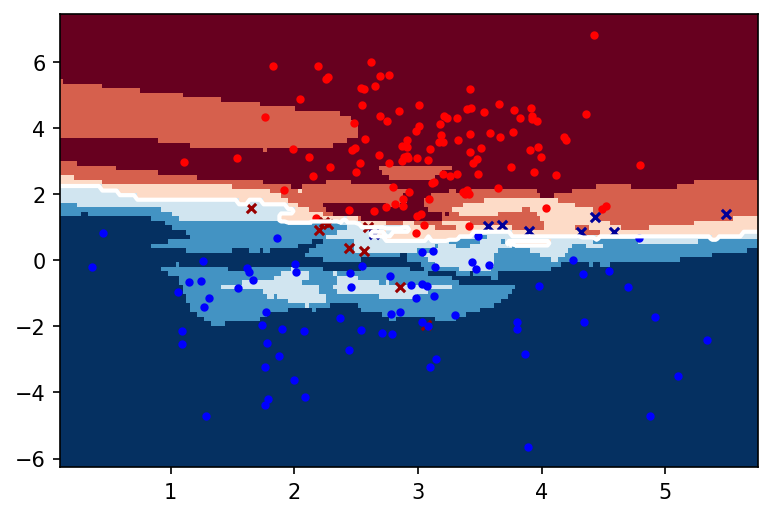

In [33]:
pdffuns.plot_data(clf, X, yx, pred_test)

### Decision region - train

..\pdffuns.py:365: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xx, yy, Z, cmap='RdBu',


<AxesSubplot:>

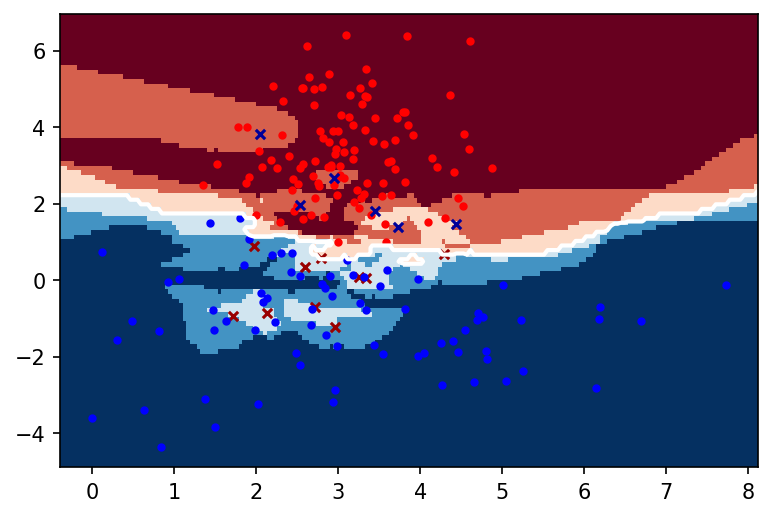

In [34]:
pdffuns.plot_data(clf, Y, yy, pred_train)

## Problem 1 e)

### Cross validate reclassification - Quadratic Discriminant Analysis

In [35]:
clf = QuadraticDiscriminantAnalysis()
cv_results = cross_validate(clf, Y, yy, cv=5)
avg = np.mean(1 - cv_results['test_score'])
std2 = 2*np.std(1 - cv_results['test_score'])
print("Average error rate: {}%".format(avg * 100))
print("2 x standard deviation of error rate: {}".format(std2))

Average error rate: 10.0%
2 x standard deviation of error rate: 0.06324555320336757


### Cross validate test - Quadratic Discriminant Analysis

In [36]:
cv_results = cross_validate(clf, X, yx, cv=5)
avg = np.mean(1 - cv_results['test_score'])
std2 = 2*np.std(1 - cv_results['test_score'])
print("Average error rate: {}%".format(avg * 100))
print("2 x standard deviation of error rate: {}".format(std2))

Average error rate: 6.0000000000000036%
2 x standard deviation of error rate: 0.06782329983125267


### Cross validate reclassification - K-Nearest neighbours

In [87]:
clf = KNeighborsClassifier(n_neighbors=5)
cv_results = cross_validate(clf, Y, yy, cv=5)
avg = np.mean(1 - cv_results['test_score'])
std2 = 2*np.std(1 - cv_results['test_score'])
print("Average error rate: {}%".format(avg * 100))
print("2 x standard deviation of error rate: {}".format(std2))

Average error rate: 9.499999999999996%
2 x standard deviation of error rate: 0.08000000000000007


### Cross validate test - K-Nearest neighbours

In [88]:
cv_results = cross_validate(clf, X, yx, cv=5)
avg = np.mean(1 - cv_results['test_score'])
std2 = 2*np.std(1 - cv_results['test_score'])
print("Average error rate: {}%".format(avg * 100))
print("2 x standard deviation of error rate: {}".format(std2))

Average error rate: 5.500000000000001%
2 x standard deviation of error rate: 0.08602325267042625


## Problem 1 f)

### Grid search on k-nearest neigbours - reclassification

In [105]:
clf = KNeighborsClassifier()
parameters = {'algorithm': ('ball_tree', 'kd_tree'), 'n_neighbors': np.arange(1, 10)}
hyper = GridSearchCV(clf, parameters)
hyper.fit(Y, yy)

cv_results = cross_validate(hyper, X, yx, cv=5)
avg = np.mean(1 - cv_results['test_score'])
std2 = 2*np.std(1 - cv_results['test_score'])
print("Average error rate: {}%".format(avg * 100))
print("2 x standard deviation of error rate: {}".format(std2))

Average error rate: 5.500000000000003%
2 x standard deviation of error rate: 0.07348469228349533


## Problem 2